有效年利率>給定利率&複利頻率，產生每年複利一次的年利率  
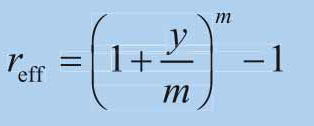  
連續型  
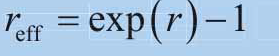  


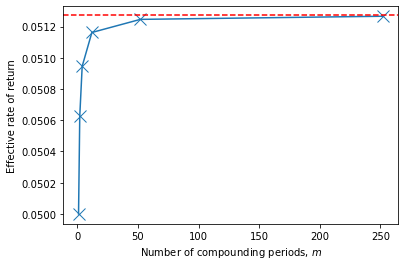

In [1]:
import math
import numpy as np
import matplotlib.pyplot as plt

def eff_rr(r, m):
    
    '''
    r = annual rate, scalar numeric decimal
    m = number of compounding periods per year
    '''
    
    eff_rate = (1 + r/m)**m - 1;
    
    return eff_rate
    
m_array = [1, 2, 4, 12, 52, 252]#不同複利頻率
r = 0.05;


eff_rr_vec = np.vectorize(eff_rr)
eff_rr_array = eff_rr_vec(r,m_array)#當複利頻率提高>簡單型會按近連續

eff_rr_from_continuous = math.exp(r) - 1;

fig, ax = plt.subplots()

plt.xlabel("Number of compounding periods, $\it{m}$") 
plt.ylabel("Effective rate of return") 
plt.plot(m_array,eff_rr_array,marker = 'x', markersize = 12, linewidth = 1.5) 
plt.axhline(y=eff_rr_from_continuous, color='r', linestyle='--')
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

plt.show()
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])


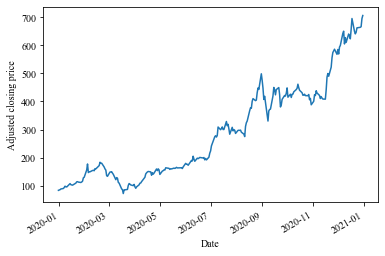

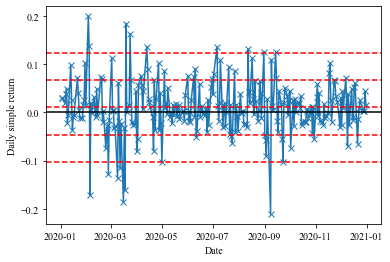

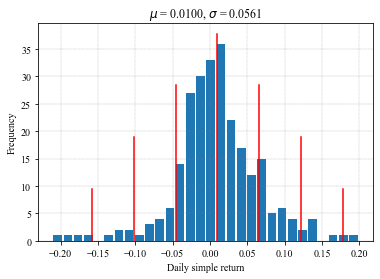

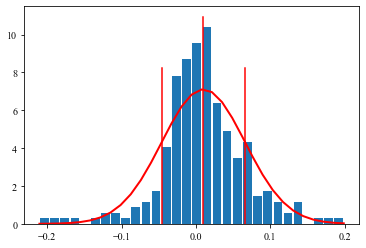

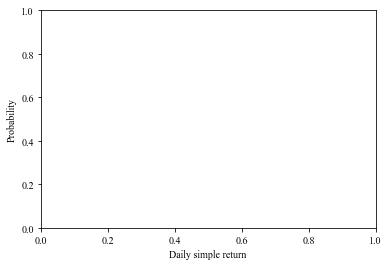

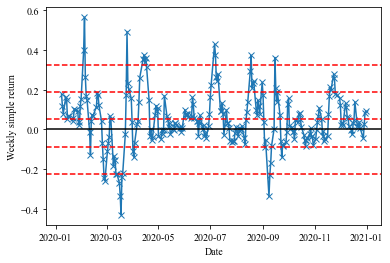

In [13]:
# B1_Ch10_2.py

###############
# Prepared by Jianbin Liang, Ran An, and Wei Lu,
# Editor-in-chief: Weisheng Jiang, and Sheng Tu
# Book 1  |  Financial Risk Management with Python
# Published and copyrighted by Tsinghua University Press
# Beijing, China, 2021
###############

# B1_Ch10_2_A.py

import pandas as pd
import numpy as np
import pandas_datareader as web
import matplotlib.pyplot as plt
import scipy.stats as stats
import statsmodels.api as sm
import pylab
import matplotlib.mlab as mlab

df = web.get_data_yahoo('TSLA', start = '2020-01-01', end = '2020-12-31')

#%% Plot price level of stock
plt.close('all')

fig, ax = plt.subplots()

df['Adj Close'].plot()
plt.xlabel('Date')
plt.ylabel('Adjusted closing price')
plt.show()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

#%% simple return of stock price

# daily returns
daily_simple_returns_pct = df['Adj Close'].pct_change()
# daily returns are not in the format of percentage.
values = daily_simple_returns_pct[1:]
mu, sigma = stats.norm.fit(values)

fig, ax = plt.subplots()

ax.plot(daily_simple_returns_pct,marker='x')
plt.axhline(y=0, color='k', linestyle='-')
plt.axhline(y=mu, color='r', linestyle='--')
plt.axhline(y=mu + sigma, color='r', linestyle='--')
plt.axhline(y=mu - sigma, color='r', linestyle='--')
plt.axhline(y=mu + 2*sigma, color='r', linestyle='--')
plt.axhline(y=mu - 2*sigma, color='r', linestyle='--')
plt.xlabel('Date')
plt.ylabel('Daily simple return')
plt.show()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

#%% Distribution of daily simple returns

label = '$\it{\mu}$ = %.4f, $\it{\sigma}$ = %.4f' % (mu, sigma)

fig, ax = plt.subplots()
ax.hist(values, bins=30, rwidth=0.85)
y_lim = ax.get_ylim()
plt.plot([mu,mu],y_lim,'r')
plt.plot([mu + sigma,mu + sigma],0.75*np.asarray(y_lim),'r')
plt.plot([mu - sigma,mu - sigma],0.75*np.asarray(y_lim),'r')
plt.plot([mu + 2.0*sigma,mu + 2.0*sigma],0.5*np.asarray(y_lim),'r')
plt.plot([mu - 2.0*sigma,mu - 2.0*sigma],0.5*np.asarray(y_lim),'r')
plt.plot([mu + 3.0*sigma,mu + 3.0*sigma],0.25*np.asarray(y_lim),'r')
plt.plot([mu - 3.0*sigma,mu - 3.0*sigma],0.25*np.asarray(y_lim),'r')
plt.title(label)
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
plt.xlabel('Daily simple return')
plt.ylabel('Frequency')

# add a normal fit PDF curve

fig, ax = plt.subplots()
# the histogram of the data
n, bins, patches = plt.hist(values, 30, density=1, rwidth=0.85)
y_lim = ax.get_ylim()
best_fit_line = stats.norm.pdf(bins, mu, sigma)
plt.plot(bins, best_fit_line, 'r-', linewidth=2)

plt.plot([mu,mu],y_lim,'r')
plt.plot([mu + sigma,mu + sigma],0.75*np.asarray(y_lim),'r')
plt.plot([mu - sigma,mu - sigma],0.75*np.asarray(y_lim),'r')

plt.show()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10
plt.xlabel('Daily simple return')
plt.ylabel('Probability')
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

#%% weekly simple returns

wkly_simple_returns_pct = df['Adj Close'].pct_change(periods = 5)
# not percentage
values = wkly_simple_returns_pct[5:]
mu, sigma = stats.norm.fit(values)

fig, ax = plt.subplots()

ax.plot(wkly_simple_returns_pct,marker='x')
plt.axhline(y=0, color='k', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Weekly simple return')

plt.axhline(y=mu, color='r', linestyle='--')
plt.axhline(y=mu + sigma, color='r', linestyle='--')
plt.axhline(y=mu - sigma, color='r', linestyle='--')
plt.axhline(y=mu + 2*sigma, color='r', linestyle='--')
plt.axhline(y=mu - 2*sigma, color='r', linestyle='--')

plt.show()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])



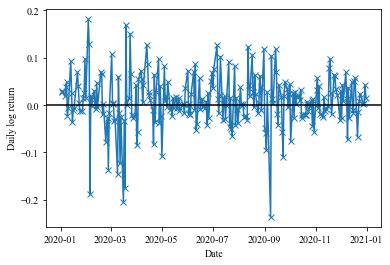

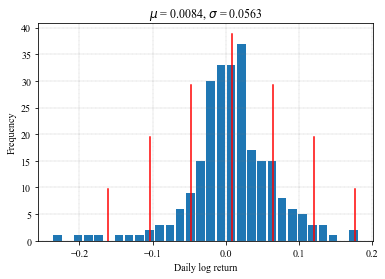

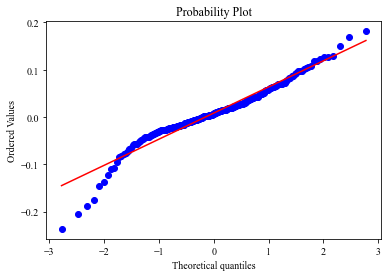

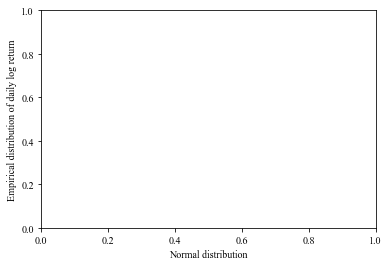

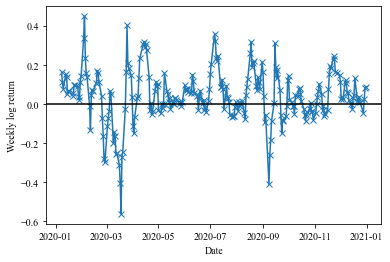

In [14]:
#%% daily log return of stock price

df_adj_close = df['Adj Close']; 

# shift moves dates back by 1
# daily log returns
df_log_r = df.apply(lambda x: np.log(x) - np.log(x.shift(1)))
daily_log_returns = df_log_r['Adj Close'];

fig, ax = plt.subplots()

ax.plot(daily_log_returns,marker='x')
plt.axhline(y=0, color='k', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Daily log return')
plt.show()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

#%% distribution of daily log returns

values = daily_log_returns[1:]
mu, sigma = stats.norm.fit(values)

label = '$\it{\mu}$ = %.4f, $\it{\sigma}$ = %.4f' % (mu, sigma)

fig, ax = plt.subplots()
ax.hist(values, bins=30, rwidth=0.85)
y_lim = ax.get_ylim()
plt.plot([mu,mu],y_lim,'r')
plt.plot([mu + sigma,mu + sigma],0.75*np.asarray(y_lim),'r')
plt.plot([mu - sigma,mu - sigma],0.75*np.asarray(y_lim),'r')
plt.plot([mu + 2.0*sigma,mu + 2.0*sigma],0.5*np.asarray(y_lim),'r')
plt.plot([mu - 2.0*sigma,mu - 2.0*sigma],0.5*np.asarray(y_lim),'r')
plt.plot([mu + 3.0*sigma,mu + 3.0*sigma],0.25*np.asarray(y_lim),'r')
plt.plot([mu - 3.0*sigma,mu - 3.0*sigma],0.25*np.asarray(y_lim),'r')
plt.title(label)
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
plt.xlabel('Daily log return')
plt.ylabel('Frequency')


fig, ax = plt.subplots()

stats.probplot(values, dist="norm", plot=pylab)
pylab.show()
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
plt.xlabel('Normal distribution')
plt.ylabel('Empirical distribution of daily log return')#分位圖（quantile-quantile plot） 比較真實分配&常態
#%% shift moves dates back by 5
# weekly log returns
df_log_r_wkly = df.apply(lambda x: np.log(x) - np.log(x.shift(5)))
wkly_log_returns = df_log_r_wkly['Adj Close'];

fig, ax = plt.subplots()

ax.plot(wkly_log_returns,marker='x')
plt.axhline(y=0, color='k', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Weekly log return')
plt.show()
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])


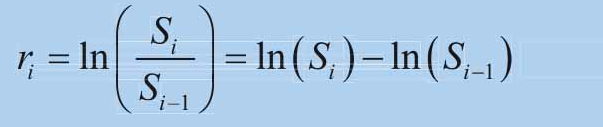  
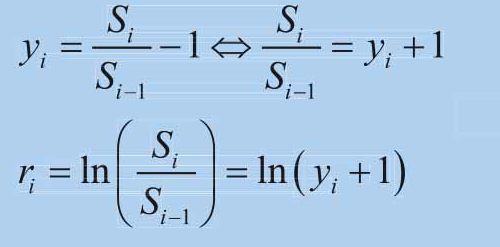

多項式function

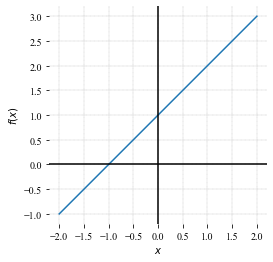

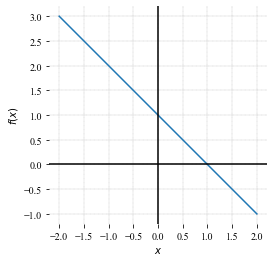

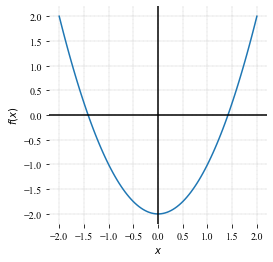

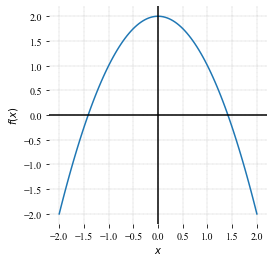

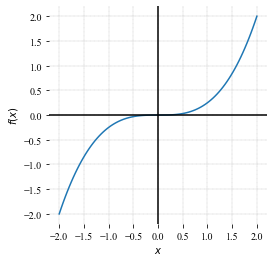

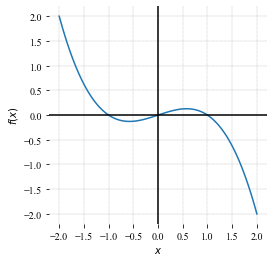

In [15]:
import math
import numpy as np
from matplotlib import pyplot as plt 

x = np.linspace(-2,2,100);

def plot_curve(x, y):
    
    fig, ax = plt.subplots()

    plt.xlabel("$\it{x}$") 
    plt.ylabel("$\it{f}(\it{x})$") 
    plt.plot(x, y, linewidth = 1.5) 
    plt.axhline(y=0, color='k', linewidth = 1.5)
    plt.axvline(x=0, color='k', linewidth = 1.5)
    ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
    plt.axis('equal')
    plt.xticks(np.arange(-2, 2.5, step=0.5))
    plt.yticks(np.arange(y.min(), y.max() + 0.5, step=0.5))
    ax.set_xlim(x.min(),x.max())
    ax.set_ylim(y.min(),y.max())
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    plt.axis('square')
#%% plot linear, quadratic, and cubic functions

plt.close('all')

# linear function
y = x + 1;

plot_curve(x, y)

# linear function
y = -x + 1;

plot_curve(x, y)

# quadratic  function, parabola opens upwards
y = np.power(x,2) - 2;

plot_curve(x, y)

# quadratic  function, parabola opens downwards
y = -np.power(x,2) + 2;

plot_curve(x, y)

# cubic function
y = np.power(x,3)/4;

plot_curve(x, y)

# cubic function
y = -(np.power(x,3) - x)/3;

plot_curve(x, y)


線性與非線性插補  


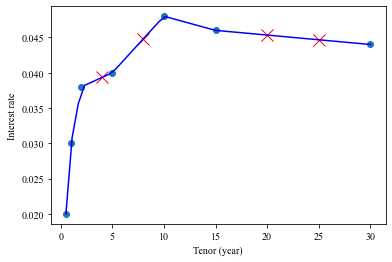

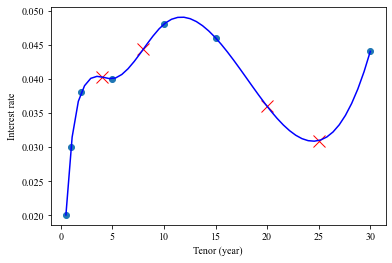

In [16]:
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, interp2d
import numpy as np

tenors = [0.5, 1, 2, 5, 10, 15, 30]
IR     = [0.02, 0.03, 0.038, 0.04, 0.048, 0.046, 0.044]

f_linear = interp1d(tenors,IR) # default is 'linear'
f_cubic  = interp1d(tenors,IR,kind = 'cubic') 


tenors_x = [4, 8, 20, 25]#欲求位置
tenors_vec = np.linspace(0.5,30,50)#總區間
IR_linear_y     = f_linear(tenors_x)
IR_linear_y_vec = f_linear(tenors_vec)

IR_cubic_y     = f_cubic(tenors_x)
IR_cubic_y_vec = f_cubic(tenors_vec)

#%% visualization

plt.close('all')

fig, ax = plt.subplots()

plt.xlabel("Tenor (year)") 
plt.ylabel("Interest rate") 
plt.plot(tenors,IR,marker = 'o', linewidth = 1.5, linestyle="None") 
plt.plot(tenors_x,IR_linear_y, color = 'r', marker = 'x', linestyle="None", markersize = 12) 
plt.plot(tenors_vec,IR_linear_y_vec, color = 'b') 

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

plt.show()
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

fig, ax = plt.subplots()

plt.xlabel("Tenor (year)") 
plt.ylabel("Interest rate") 
plt.plot(tenors,IR,marker = 'o', linewidth = 1.5, linestyle="None") 
plt.plot(tenors_x,IR_cubic_y, color = 'r', marker = 'x', linestyle="None", markersize = 12) 
plt.plot(tenors_vec,IR_cubic_y_vec, color = 'b') 

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

plt.show()
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])


C:\Users\antho\AppData\Local\Temp/ipykernel_2964/659249853.py:47: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


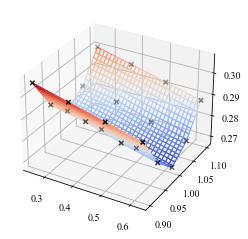

C:\Users\antho\AppData\Local\Temp/ipykernel_2964/659249853.py:74: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


<Figure size 432x288 with 0 Axes>

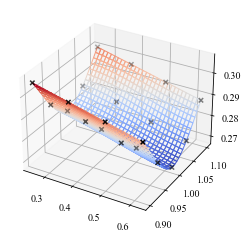

<Figure size 432x288 with 0 Axes>

In [19]:
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d, interp2d
import numpy as np
from matplotlib import cm

IV = [[0.306, 0.302, 0.298, 0.294],#隱波
      [0.290, 0.287, 0.282, 0.278],
      [0.281, 0.277, 0.273, 0.269],
      [0.287, 0.284, 0.279, 0.275],
      [0.300, 0.296, 0.292, 0.288]]


# surface of implied volatility
 
tau = [0.25, 0.375, 0.5, 0.625]; 
# time to maturity
 
Moneyness = [0.9, 0.95, 1, 1.05, 1.1]; 
# Moneyness, S/K

xx,yy = np.meshgrid(tau,Moneyness)

x_array = np.squeeze(np.asarray(xx))
y_array = np.squeeze(np.asarray(yy))
z_array = np.squeeze(np.asarray(IV))

#插補模型
f_linear = interp2d(tau,Moneyness,IV) # default = linear 
f_cubic  = interp2d(tau,Moneyness,IV, kind = 'cubic')

x_q = np.linspace(0.25, 0.625 ,30)
y_q = np.linspace(0.9,  1.1   ,30)

xx_q,yy_q = np.meshgrid(x_q,y_q)

zz_q_linear = f_linear(x_q,y_q)
zz_q_cubic  = f_cubic(x_q,y_q)

#%% visualization

plt.close('all')

# Normalize to [0,1]
norm = plt.Normalize(zz_q_linear.min(), zz_q_linear.max())
colors = cm.coolwarm(norm(zz_q_linear))

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(xx_q, yy_q, zz_q_linear,
    facecolors=colors, shade=False)
surf.set_facecolor((0,0,0,0))

ax.scatter(x_array, y_array, z_array, c='k', marker='x')

plt.show()

plt.tight_layout()
ax.set_xlabel('Time to maturity')
ax.set_ylabel('Moneyness')
ax.set_zlabel('Vol')

ax.xaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
ax.yaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
ax.zaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = "10"
ax.view_init(30, 30)

# Normalize to [0,1]
norm = plt.Normalize(zz_q_cubic.min(), zz_q_cubic.max())
colors = cm.coolwarm(norm(zz_q_cubic))

fig = plt.figure()
ax = fig.gca(projection='3d')
surf = ax.plot_surface(xx_q, yy_q, zz_q_cubic,
    facecolors=colors, shade=False)
surf.set_facecolor((0,0,0,0))

ax.scatter(x_array, y_array, z_array, c='k', marker='x')

plt.show()

plt.tight_layout()
ax.set_xlabel('Time to maturity')
ax.set_ylabel('Moneyness')
ax.set_zlabel('Vol')

ax.xaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
ax.yaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
ax.zaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = "10"
ax.view_init(30, 30)
#價平&長到期 IV最低

等比數列化簡  
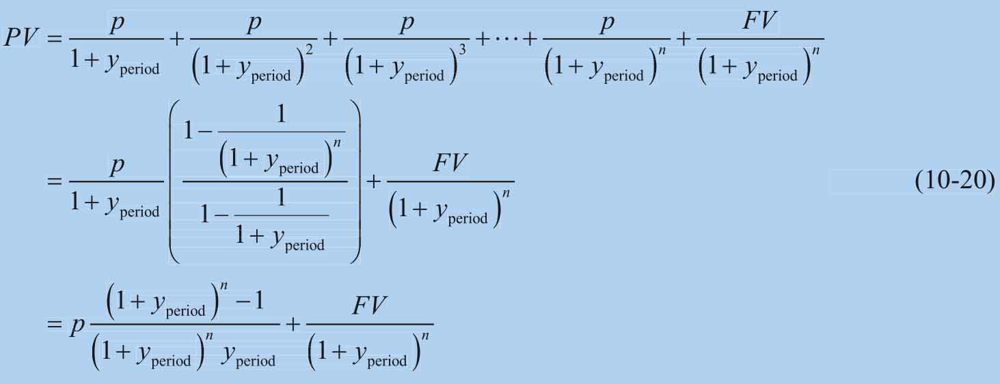

In [23]:
def pvfix(y_p, nper, pmt, fv):
    
    '''
    r_p : periodic interest rate
    nper: number of payment periods
    pmt : periodic payment
    fv  : payment received other than pmt 
    in the end of the last period
    '''
    pv = pmt*((1.0 + y_p)**nper - 1.0)/(1.0 + y_p)**nper/y_p + \
    fv/(1.0 + y_p)**nper;
    
    return pv

y = 0.05;  # annual interest rate
m = 4;     # compounding frequency
T = 5;     # years
c = 10;    # annual payment
pmt = c/m  # periodic payment
fv = 100;  # payment at the end

PV = pvfix(y/m, m*T, pmt, fv)


Exponentially Weighted Moving Average常用來計波動率，也會用到等比數列之和  
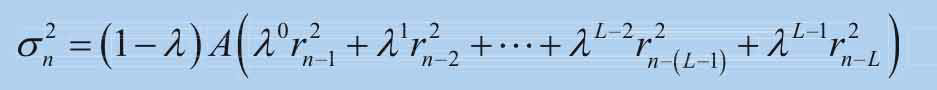  
lambda為decay factor，A為需要求解之係數  
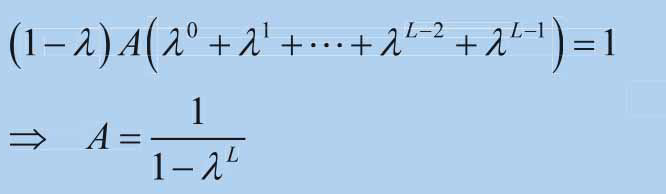  
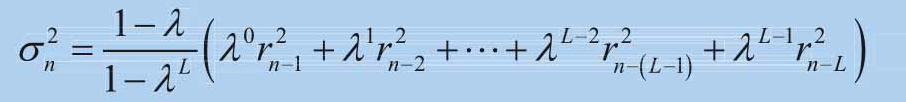  
其中每個權重lambda為  
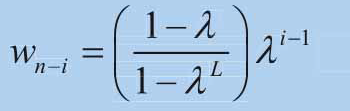  
當decay factor=0.94，權重隨時間之變化  
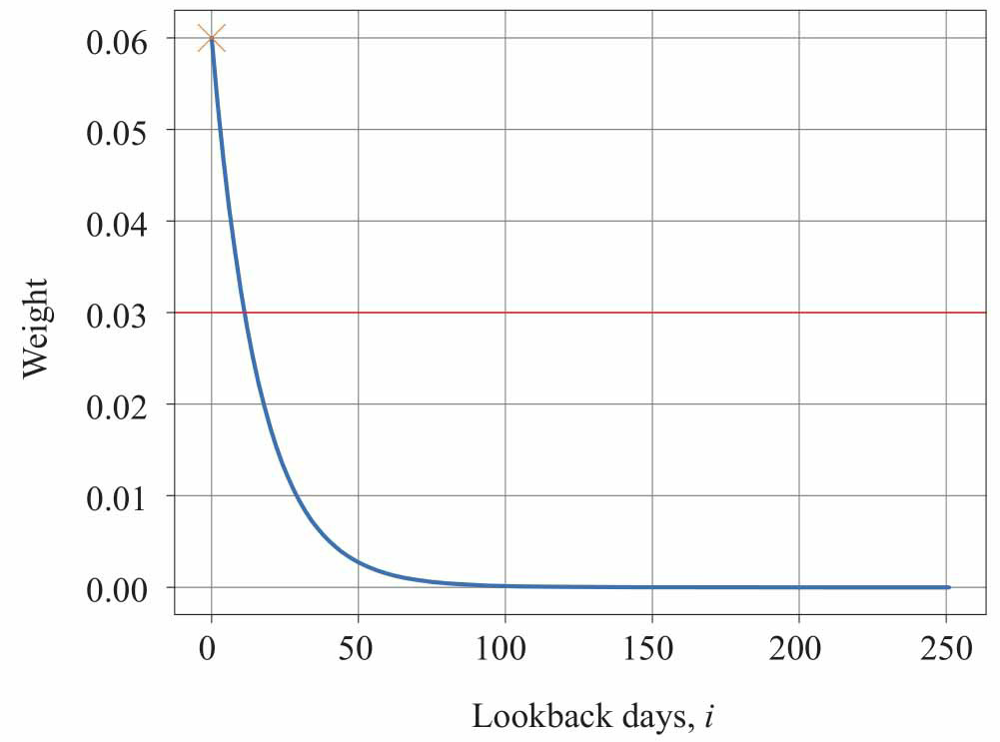  
EWMA半衰期  
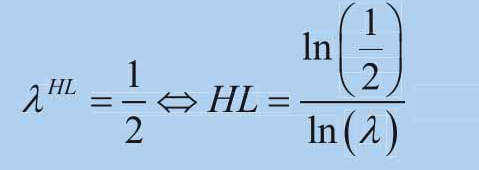  
不同decay factor對應之半衰期  
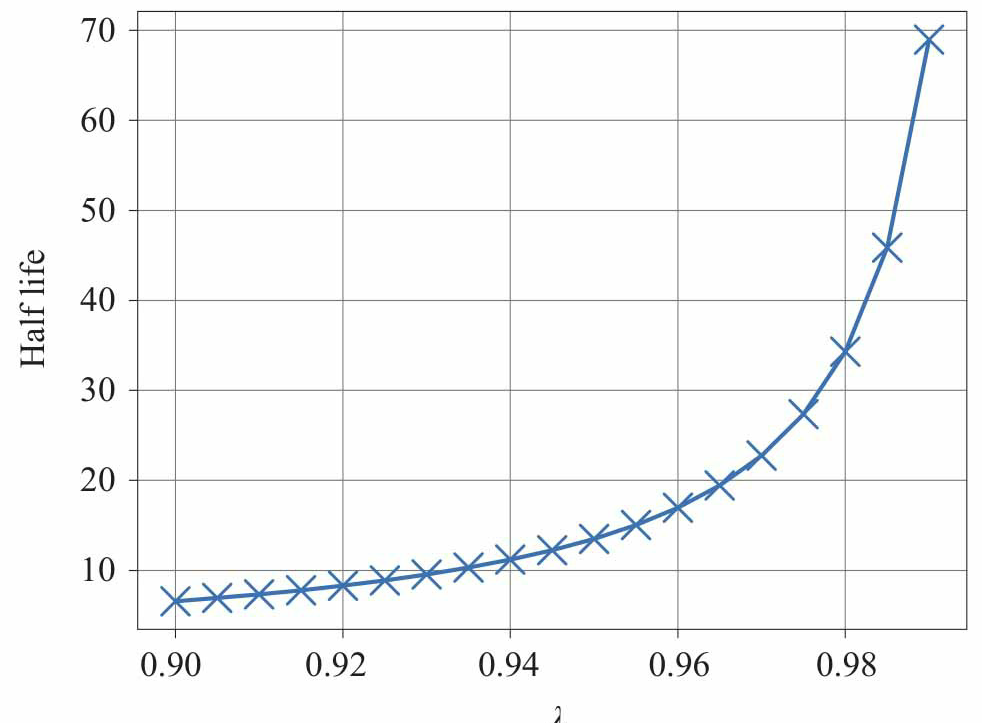  
1995 年 J.P Morgan 提出指數加權移動平均法(EWMA)估計波動度(因波動愈近，影響愈大)(lambda 日:0.94 月0.97)  
lambda=資料發生變化之追蹤能力  






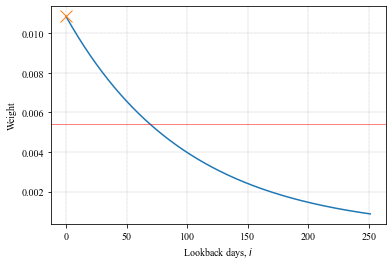

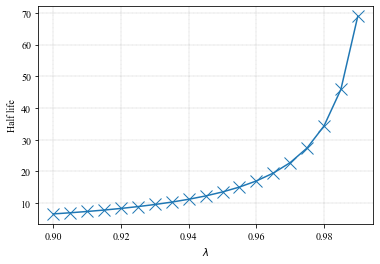

In [34]:
import numpy as np
from matplotlib import pyplot as plt 

L = 252   # lookback window, 252 business days in a year

lambda_94 = 0.99; #會影響不同lag期之權重

i_days = range(0,L);

weights = (1.0 - lambda_94)/(1 - lambda_94**L)*np.power(lambda_94,i_days)

plt.close('all')

fig, ax = plt.subplots()

plt.plot(i_days, weights, linewidth = 1.5) 
plt.plot(i_days[0], weights[0], marker = 'x',markersize = 12) 
plt.axhline(y=weights[0]/2, color='r', linewidth = 0.5)
ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])

x_label = "Lookback days, $\it{i}$" 
ax.set_xlabel(x_label)
y_label = "Weight" 
ax.set_ylabel(y_label)
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = "10"


lambda_array = np.linspace (0.99,0.9,num = 19)

HL = np.log(1.0/2.0)/np.log(lambda_array)

fig, ax = plt.subplots()

plt.xlabel("$\it{\lambda}$") 
plt.ylabel("Half life") 
plt.plot(lambda_array, HL, marker = 'x',markersize = 12) 

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = "10"


In [45]:
import numpy as np
import numpy_financial as npf
CFs = [-400, 120, 80, 180, 100];
CFs_flip = CFs[::-1]#反轉 從last開始

roots = np.roots(CFs_flip) #要先由高次到低次排好 求解其=0時之根 即irr
mask = (roots.imag == 0) & (roots.real > 0)

x = roots[mask].real

irr_replicated = 1/x - 1#折現值反轉回irr

irr_result = npf.irr(CFs)
print("IRR = " + str(round(irr_result,5)))


IRR = 0.07569


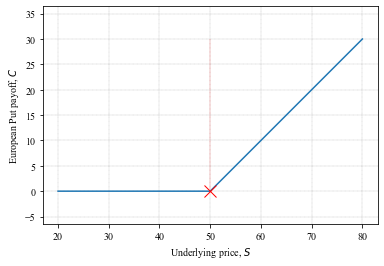

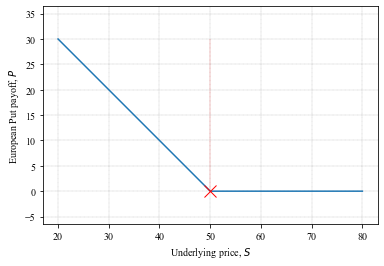

In [46]:
import math
import numpy as np
from matplotlib import pyplot as plt 

St_array = np.linspace(20,80,300);#spot 20-80 分300
K = 50; # strike price  fixed

# payoff of European call option
C_payoff = np.maximum(St_array - K, 0)

# payoff of European put option
P_payoff = np.maximum(K - St_array, 0)

plt.close('all')

fig, ax = plt.subplots()

plt.xlabel("Underlying price, $\it{S}$") 
plt.ylabel("European Put payoff, $\it{C}$") 
plt.plot(St_array,C_payoff, linewidth = 1.5) 
plt.plot(K,0,'xr',linewidth = 0.25,markersize=12)
plt.plot([K,K],[0,np.max(C_payoff)],'r--',linewidth = 0.25)

plt.axis('equal')

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
# plt.grid(True)

plt.show()

fig, ax = plt.subplots()

plt.xlabel("Underlying price, $\it{S}$") 
plt.ylabel("European Put payoff, $\it{P}$") 
plt.plot(St_array,P_payoff,linewidth = 1.5) 
plt.plot(K,0,'xr',linewidth = 0.25,markersize=12)
plt.plot([K,K],[0,np.max(P_payoff)],'r--',linewidth = 0.25)

plt.axis('equal')

plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 10

ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
# plt.grid(True)

plt.show()


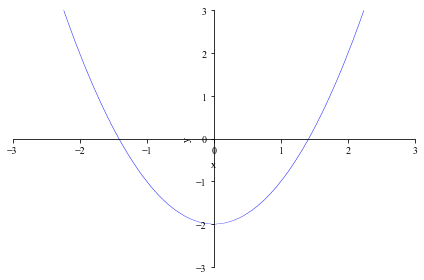

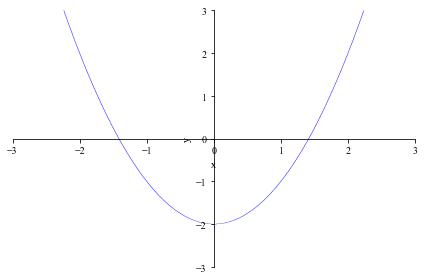

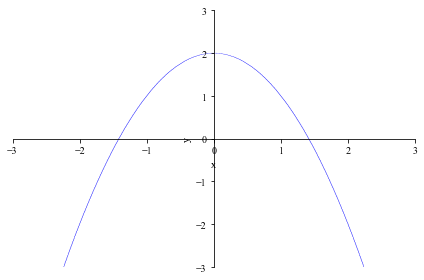

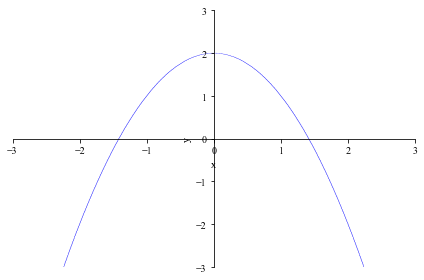

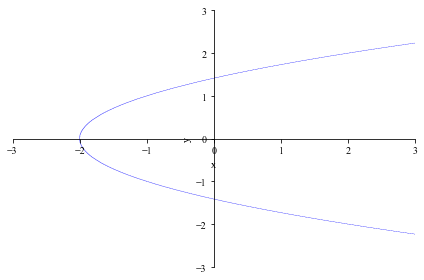

...

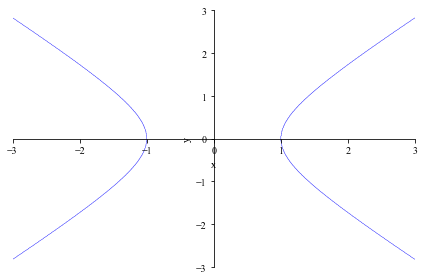

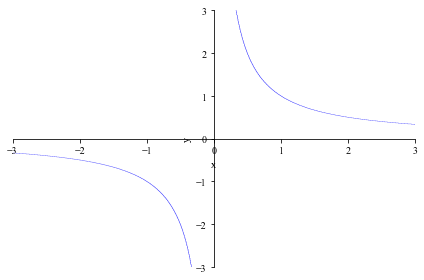

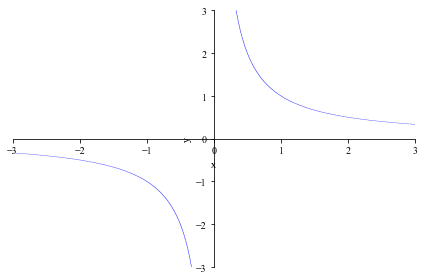

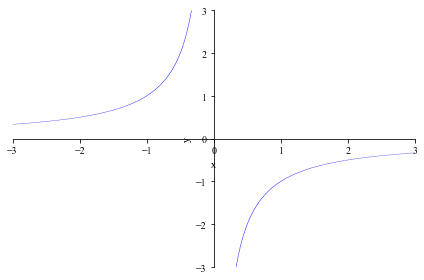

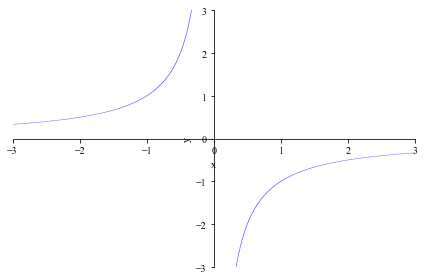

In [47]:
from matplotlib import pyplot as plt 
from sympy import plot_implicit, symbols, Eq
x, y = symbols('x y')


def plot_curve(Eq_sym):

    h_plot = plot_implicit(Eq_sym, (x, -3, 3), (y, -3, 3)) 
    h_plot.show()

#%% plot linear, quadratic, and cubic functions

plt.close('all')

#%% Parabola 

Eq_sym = Eq(x**2 - y,2)
plot_curve(Eq_sym)

Eq_sym = Eq(x**2 + y,2)
plot_curve(Eq_sym)

Eq_sym = Eq(x - y**2,-2)
plot_curve(Eq_sym)

Eq_sym = Eq(x + y**2,2)
plot_curve(Eq_sym)


#%% Ellipse 

Eq_sym = Eq(x**2/4 + y**2,1)
plot_curve(Eq_sym)

Eq_sym = Eq(x**2 + y**2/4,1)
plot_curve(Eq_sym)

Eq_sym = Eq(5*x**2/8 -3*x*y/4 + 5*y**2/8,1)
plot_curve(Eq_sym)

Eq_sym = Eq(5*x**2/8 +3*x*y/4 + 5*y**2/8,1)
plot_curve(Eq_sym)

#%% Hyperbola 

Eq_sym = Eq(-x**2 + y**2,1)
plot_curve(Eq_sym)

Eq_sym = Eq(x**2 - y**2,1)
plot_curve(Eq_sym)

Eq_sym = Eq(x*y,1)
plot_curve(Eq_sym)

Eq_sym = Eq(-x*y,1)
plot_curve(Eq_sym)


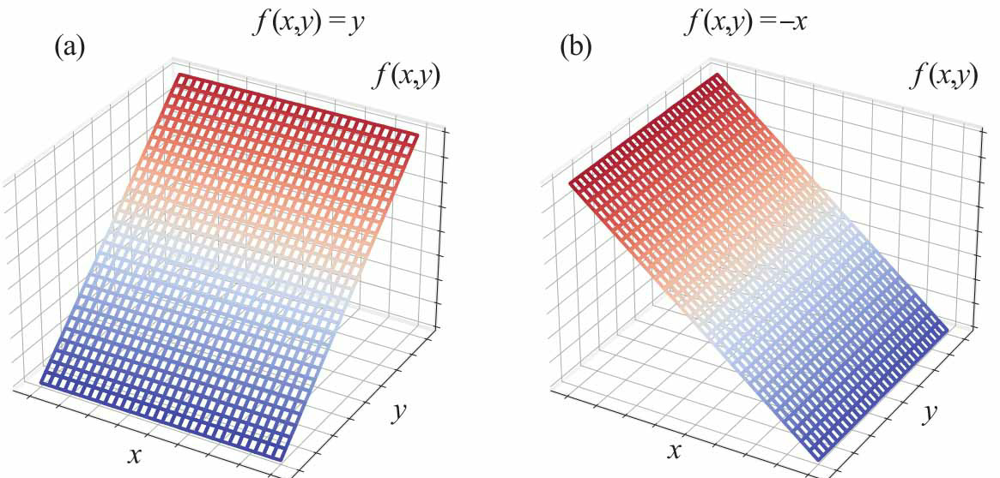  
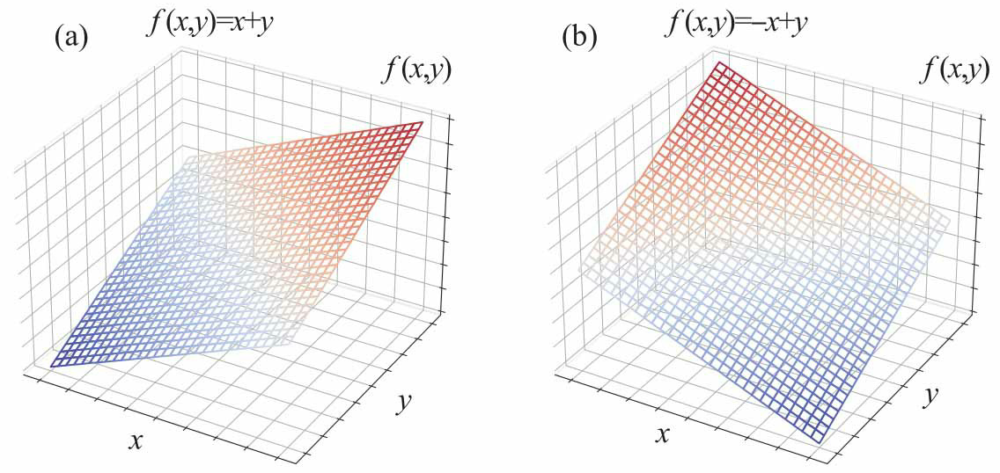  
左圖當x增大，f(x,y)增大，此方向即為梯度方向  
即  
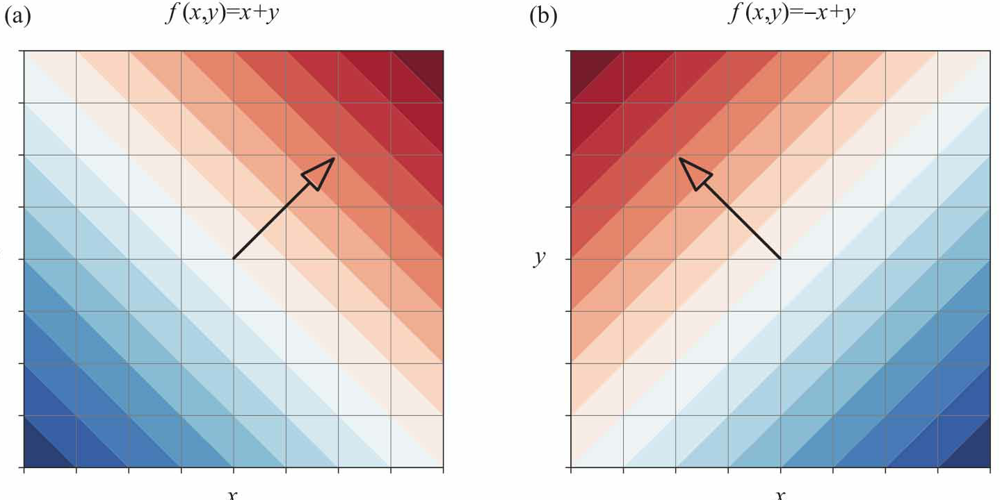  
假設投組2風險asset  
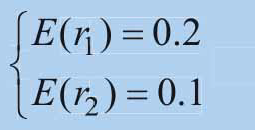  
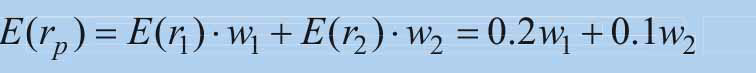  
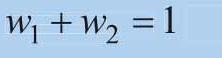  
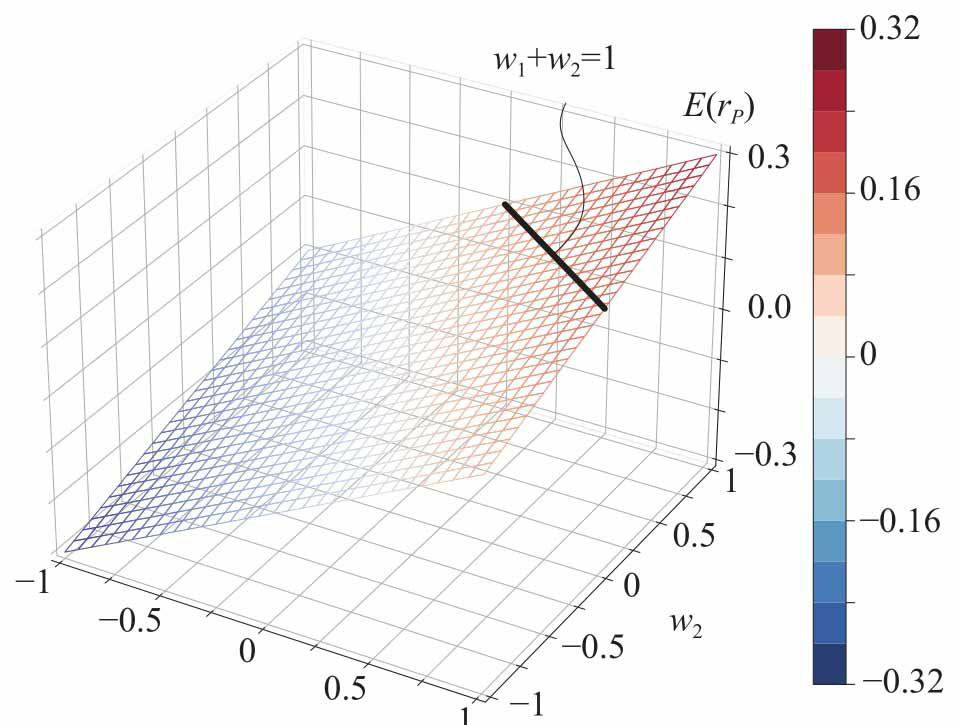  
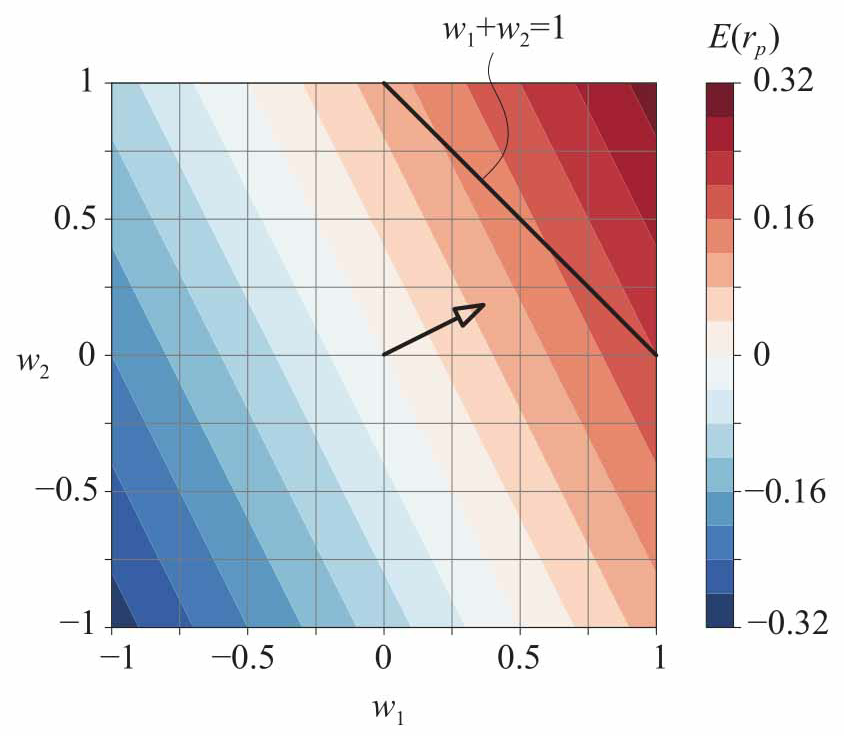


C:\Users\antho\AppData\Local\Temp/ipykernel_2964/3104203916.py:24: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


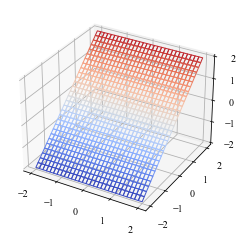

<Figure size 432x288 with 0 Axes>

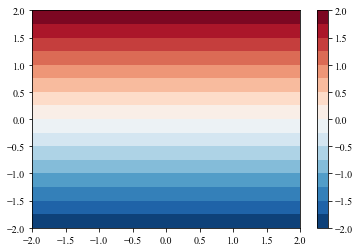

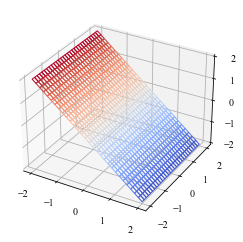

<Figure size 432x288 with 0 Axes>

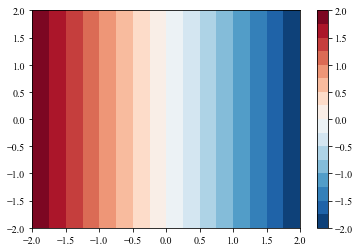

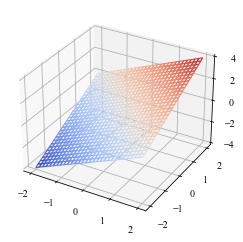

<Figure size 432x288 with 0 Axes>

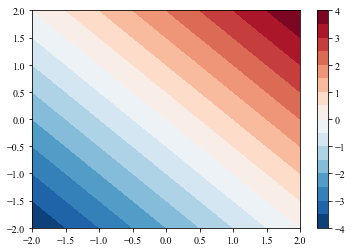

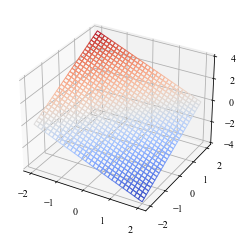

<Figure size 432x288 with 0 Axes>

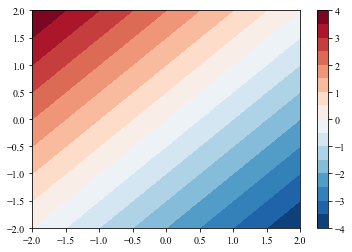

In [48]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

def mesh_square(x0,y0,r,num):
    
    # generate mesh using polar coordinates
 
    rr = np.linspace(-r,r,num)
    xx,yy = np.meshgrid(rr,rr);
 
    xx = xx + x0; 
    yy = yy + y0;
    
    return xx, yy

def plot_surf(xx,yy,zz,caption):

    norm_plt = plt.Normalize(zz.min(), zz.max())
    colors = cm.coolwarm(norm_plt(zz))

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(xx,yy,zz,
    facecolors=colors, shade=False)
    surf.set_facecolor((0,0,0,0))
    # z_lim = [zz.min(),zz.max()]
    # ax.plot3D([0,0],[0,0],z_lim,'k')
    plt.show()

    plt.tight_layout()
    ax.set_xlabel('$\it{x}$')
    ax.set_ylabel('$\it{y}$')
    ax.set_zlabel('$\it{f}$($\it{x}$,$\it{y}$)')
    ax.set_title(caption)


    ax.xaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
    ax.yaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
    ax.zaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})

    plt.rcParams["font.family"] = "Times New Roman"
    plt.rcParams["font.size"] = "10"

def plot_contourf(xx,yy,zz,caption):
    
    fig, ax = plt.subplots()

    cntr2 = ax.contourf(xx,yy,zz, levels = 15, cmap="RdBu_r")

    fig.colorbar(cntr2, ax=ax)
    plt.show()

    ax.set_xlabel('$\it{x}$')
    ax.set_ylabel('$\it{y}$')

    ax.set_title(caption)
    ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
    
#%% initialization

x0  = 0;  # center of the mesh
y0  = 0;  # center of the mesh
r   = 2;  # radius of the mesh
num = 30; # number of mesh grids
xx,yy = mesh_square(x0,y0,r,num); # generate mesh

#%% f(x,y) = y
plt.close('all')

zz1 = yy;
caption = '$\it{f} = \it{y}$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = -x

zz1 = -xx;
caption = '$\it{f} = -\it{x}$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = x + y

zz1 = xx + yy;
caption = '$\it{f} = \it{x} + \it{y}$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = -x + y

zz1 = -xx + yy;
caption = '$\it{f} = -\it{x} + \it{y}$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)


二次曲面  
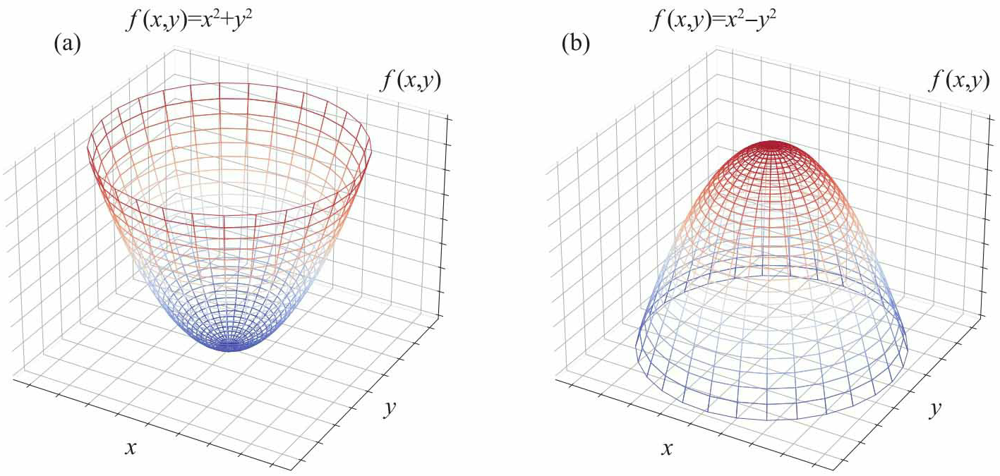  
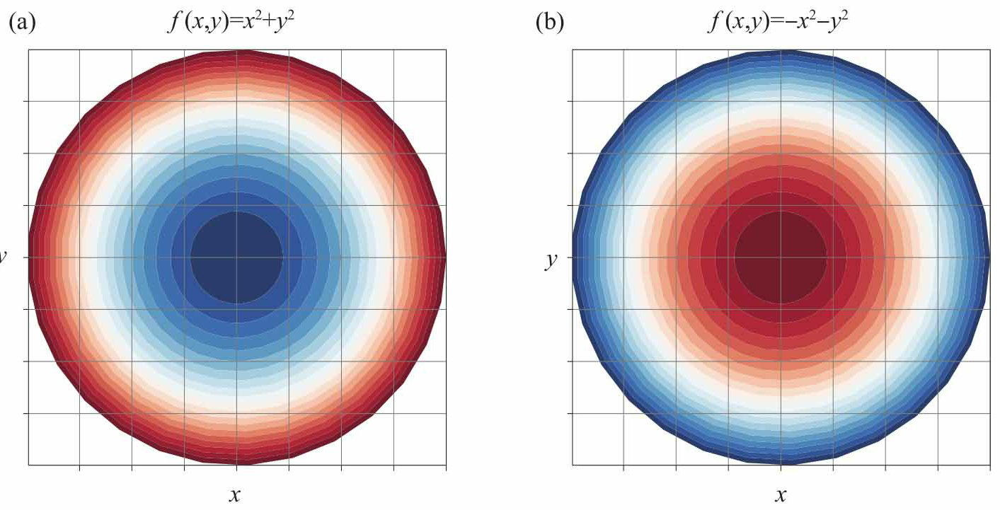  
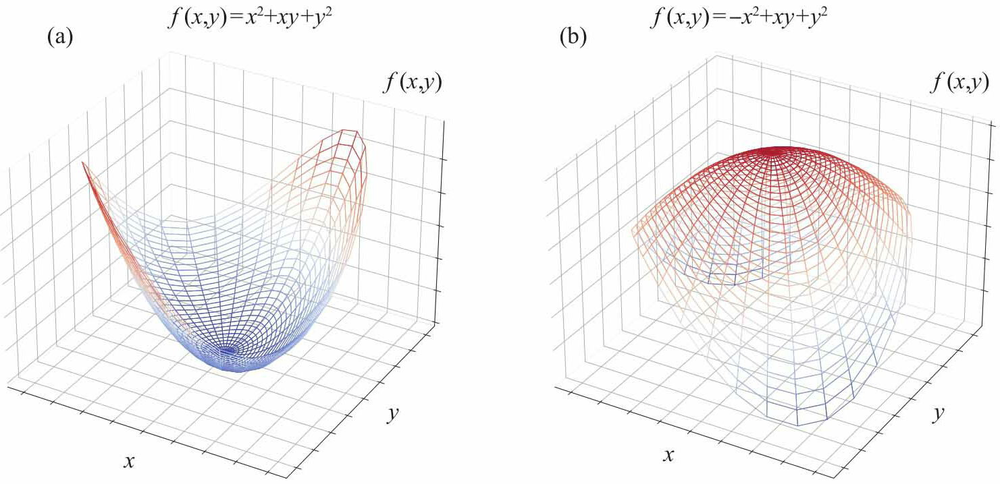  
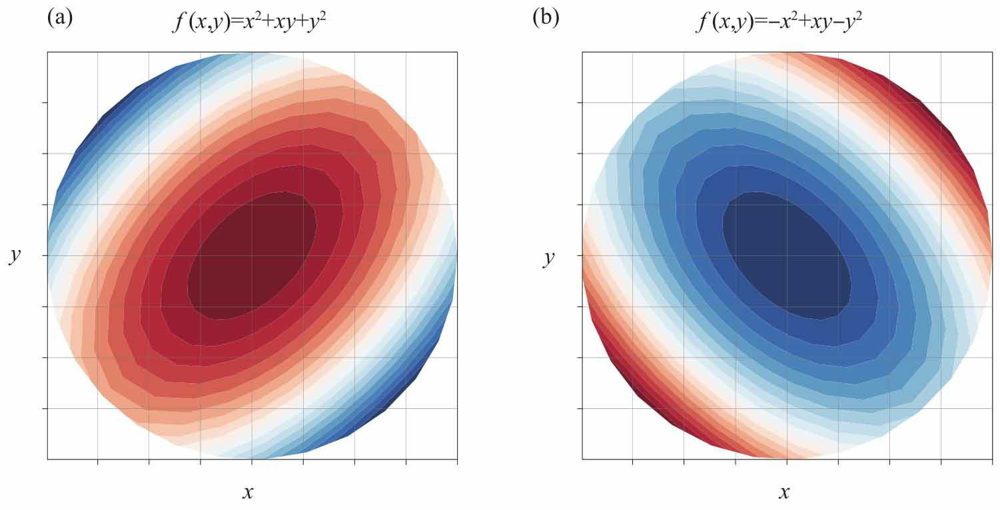  
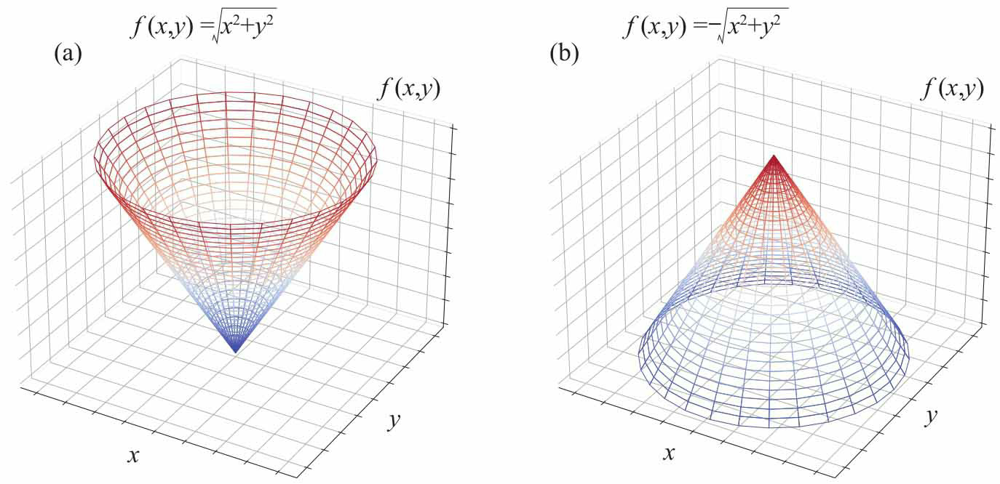  
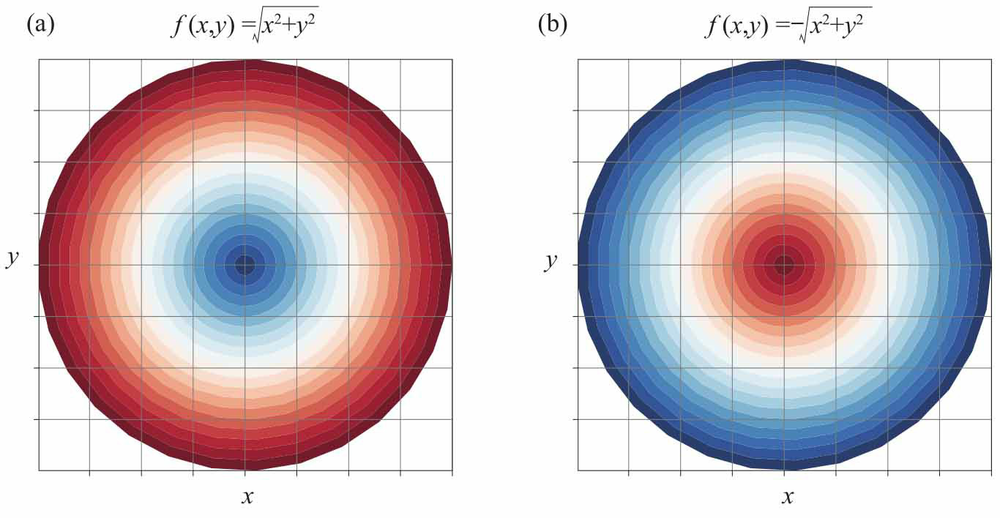  
投組變異  
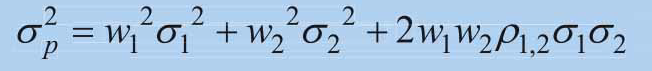
標準差  
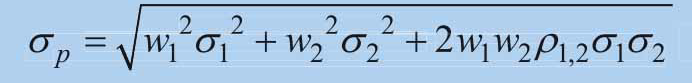  
其中  
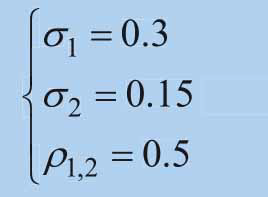  
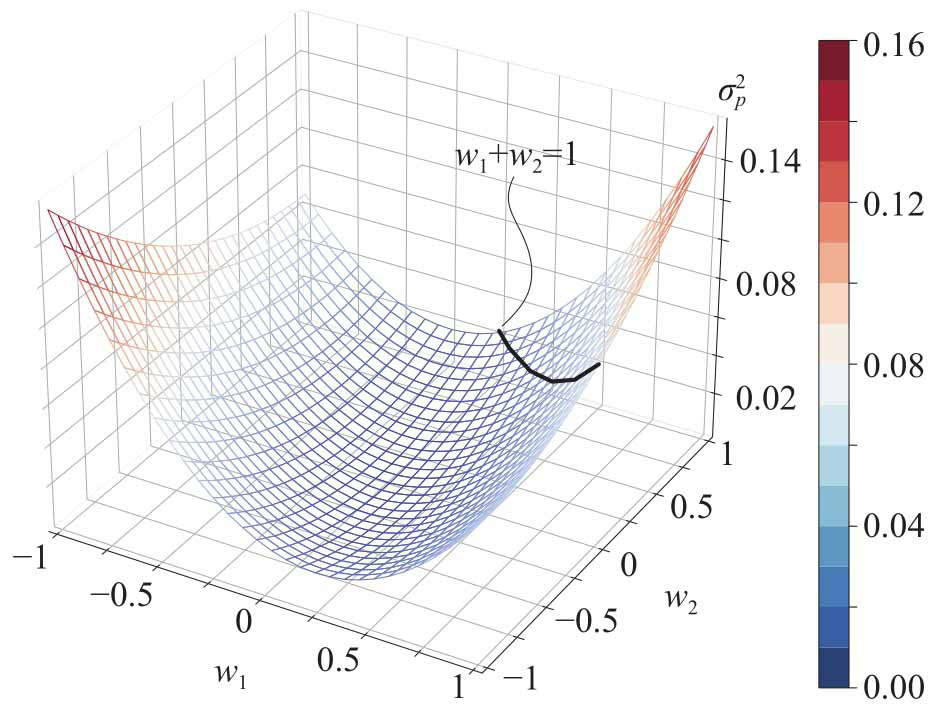  
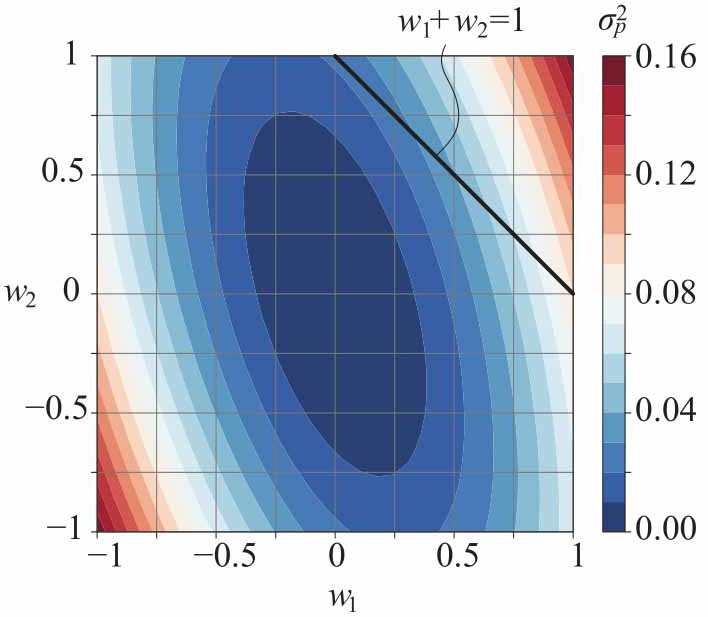  
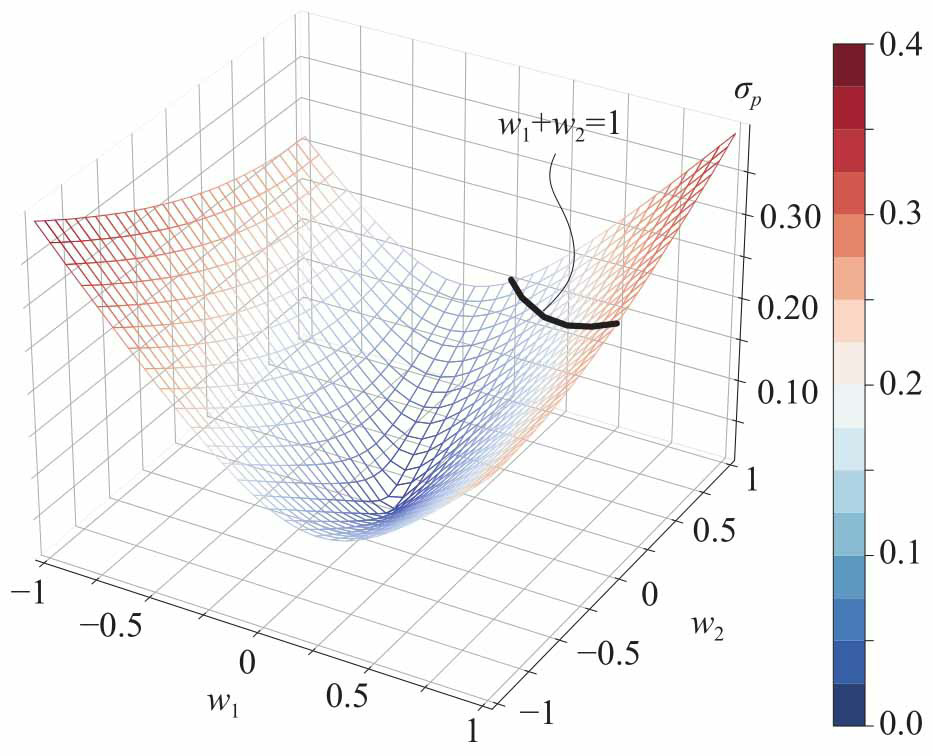  
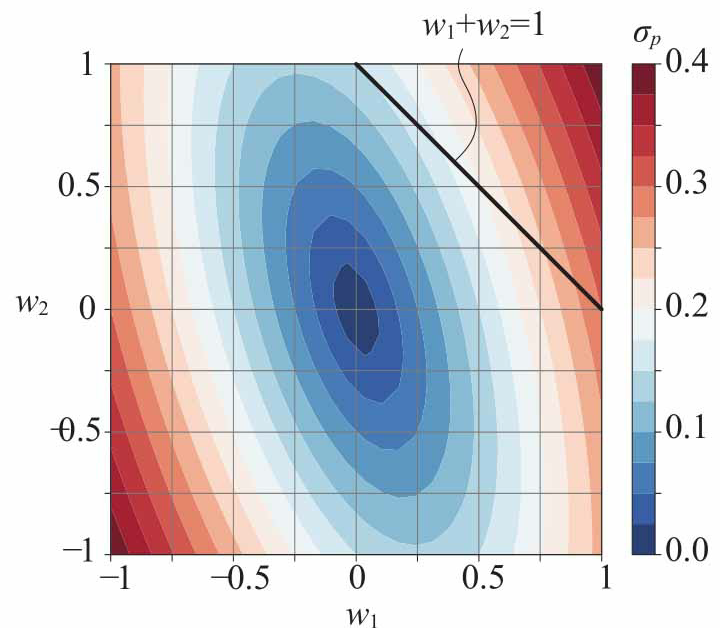



C:\Users\antho\AppData\Local\Temp/ipykernel_2964/841550894.py:26: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


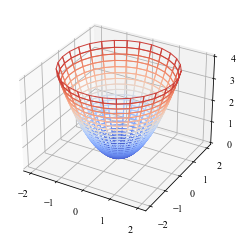

<Figure size 432x288 with 0 Axes>

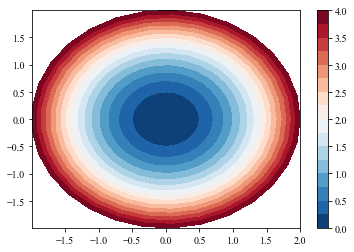

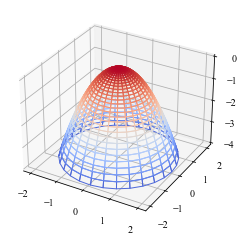

<Figure size 432x288 with 0 Axes>

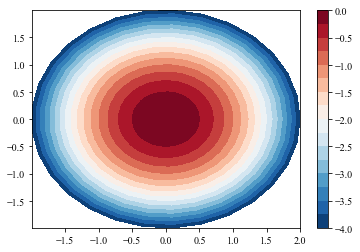

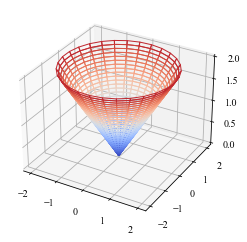

<Figure size 432x288 with 0 Axes>

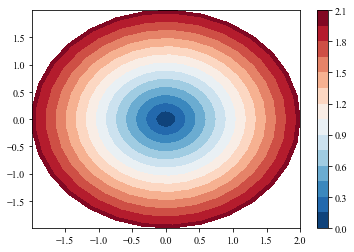

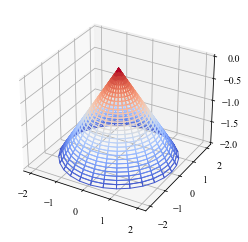

<Figure size 432x288 with 0 Axes>

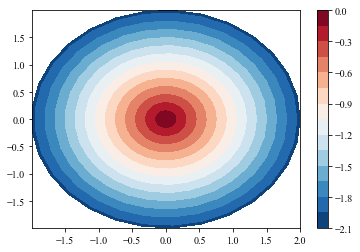

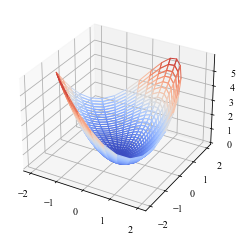

<Figure size 432x288 with 0 Axes>

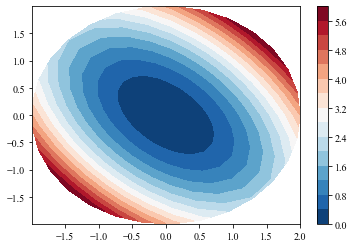

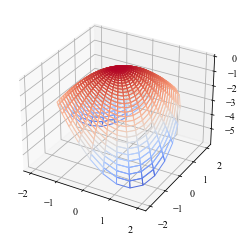

<Figure size 432x288 with 0 Axes>

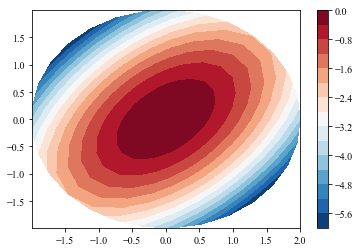

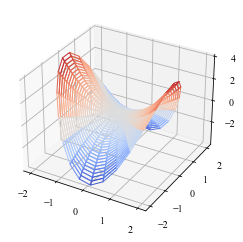

<Figure size 432x288 with 0 Axes>

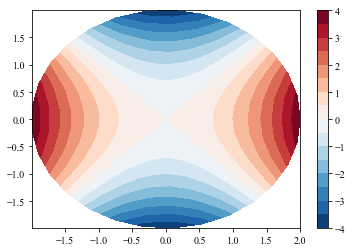

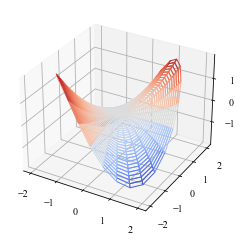

<Figure size 432x288 with 0 Axes>

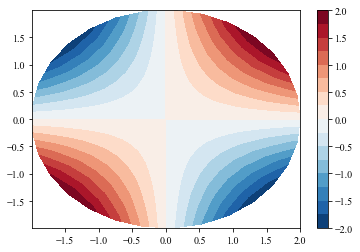

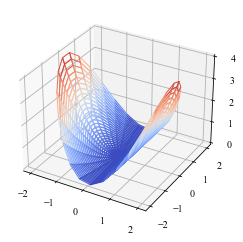

<Figure size 432x288 with 0 Axes>

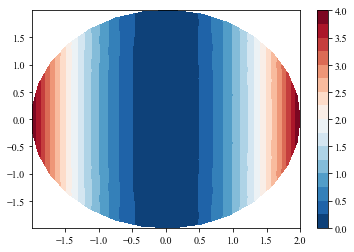

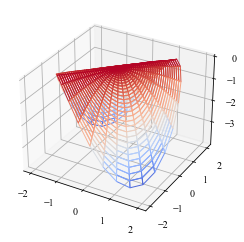

<Figure size 432x288 with 0 Axes>

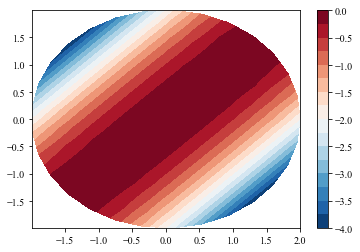

In [49]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm

def mesh_circ(x0,y0,r,num):
    
    # generate mesh using polar coordinates
 
    theta = np.linspace(0,2*math.pi,num)
    r = np.linspace(0,r,num);

    theta_matrix,r_matrix = np.meshgrid(theta,r);
 
    xx = np.multiply(np.cos(theta_matrix), r_matrix) + x0; 
    yy = np.multiply(np.sin(theta_matrix), r_matrix) + y0;
    
    return xx, yy

def plot_surf(xx,yy,zz,caption):

    norm_plt = plt.Normalize(zz.min(), zz.max())
    colors = cm.coolwarm(norm_plt(zz))

    fig = plt.figure()
    ax = fig.gca(projection='3d')
    surf = ax.plot_surface(xx,yy,zz,
    facecolors=colors, shade=False)
    surf.set_facecolor((0,0,0,0))
    # z_lim = [zz.min(),zz.max()]
    # ax.plot3D([0,0],[0,0],z_lim,'k')
    plt.show()

    plt.tight_layout()
    ax.set_xlabel('$\it{x}$')
    ax.set_ylabel('$\it{y}$')
    ax.set_zlabel('$\it{f}$($\it{x}$,$\it{y}$)')
    ax.set_title(caption)


    ax.xaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
    ax.yaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})
    ax.zaxis._axinfo["grid"].update({"linewidth":0.25, "linestyle" : ":"})

    plt.rcParams["font.family"] = "Times New Roman"
    plt.rcParams["font.size"] = "10"

def plot_contourf(xx,yy,zz,caption):
    
    fig, ax = plt.subplots()

    cntr2 = ax.contourf(xx,yy,zz, levels = 15, cmap="RdBu_r")

    fig.colorbar(cntr2, ax=ax)
    plt.show()

    ax.set_xlabel('$\it{x}$')
    ax.set_ylabel('$\it{y}$')

    ax.set_title(caption)
    ax.grid(linestyle='--', linewidth=0.25, color=[0.5,0.5,0.5])
    
#%% initialization

x0  = 0;  # center of the mesh
y0  = 0;  # center of the mesh
r   = 2;  # radius of the mesh
num = 30; # number of mesh grids
xx,yy = mesh_circ(x0,y0,r,num); # generate mesh

#%% f(x,y) = x^2 + y^2, circular paraboloid
plt.close('all')

zz1 = np.multiply(xx, xx) + np.multiply(yy, yy);
caption = '$\it{f} = \it{x}^2 + \it{y}^2$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = - x^2 - y^2, circular paraboloid

zz1 = -np.multiply(xx, xx) - np.multiply(yy, yy);
caption = '$\it{f} = -\it{x}^2 - \it{y}^2$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = (x^2 + y^2)^(1/2), circular cone

zz1 = np.sqrt(np.multiply(xx, xx) + np.multiply(yy, yy));
caption = '$\it{f} = (\it{x}^2 + \it{y}^2)^{1/2}$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = -(x^2 + y^2)^(1/2), circular cone

zz1 = -np.sqrt(np.multiply(xx, xx) + np.multiply(yy, yy));
caption = '$\it{f} = -(\it{x}^2 + \it{y}^2)^{1/2}$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = x^2 + xy + y^2, elliptic paraboloid

zz1 = np.multiply(xx, xx) + np.multiply(xx, yy) + np.multiply(yy, yy);
caption = '$\it{f} = \it{x}^2 + \it{xy} + \it{y}^2$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = - x^2 + xy - y^2, elliptic paraboloid

zz1 = -np.multiply(xx, xx) + np.multiply(xx, yy) - np.multiply(yy, yy);
caption = '$\it{f} = -\it{x}^2 + \it{xy} - \it{y}^2$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = x^2 - y^2, hyperbolic paraboloid, saddle surface

zz1 = np.multiply(xx, xx) - np.multiply(yy, yy);
caption = '$\it{f} = \it{x}^2 - \it{y}^2$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = x*y, hyperbolic paraboloid, saddle surface

zz1 = np.multiply(xx, yy);
caption = '$\it{f} = \it{xy}$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = x^2, valley surface

zz1 = np.multiply(xx, xx);
caption = '$\it{f} = \it{x}^2$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)

#%% f(x,y) = -x^2/2 + xy - y^2/2, ridge surface

zz1 = -np.multiply(xx, xx)/2.0 + np.multiply(xx, yy) - np.multiply(yy, yy)/2.0;
caption = '$\it{f} = -\it{x}^2/2 + \it{xy} - \it{y}^2/2$';
plot_surf (xx,yy,zz1,caption)
plot_contourf (xx,yy,zz1,caption)
